In [44]:
import numpy as np
import scipy.stats
import pandas as pd
import seaborn as sns
from scipy.stats import chi2
from scipy.stats import stats
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,roc_auc_score

Loading the Data


In [2]:
df = pd.read_csv('.../kaggle/input/predicting-credit-card-customer-attrition-with-m/BankChurners.csv')


In [3]:
print(f'Shape: {df.shape}')
print(df.head)
print(df.tail)

Shape: (10127, 23)
<bound method NDFrame.head of        CLIENTNUM     Attrition_Flag  Customer_Age Gender  Dependent_count  \
0      768805383  Existing Customer            45      M                3   
1      818770008  Existing Customer            49      F                5   
2      713982108  Existing Customer            51      M                3   
3      769911858  Existing Customer            40      F                4   
4      709106358  Existing Customer            40      M                3   
...          ...                ...           ...    ...              ...   
10122  772366833  Existing Customer            50      M                2   
10123  710638233  Attrited Customer            41      M                2   
10124  716506083  Attrited Customer            44      F                1   
10125  717406983  Attrited Customer            30      M                2   
10126  714337233  Attrited Customer            43      F                2   

      Education_Level Mari

In [4]:
print(df.columns)

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')


In [5]:
df = df.drop(['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
        'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], axis=1)

df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [6]:
df.info()
#There are null data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [7]:
'''checking for unknowns in the dataset '''
print(df[df == 'Unknown'].count())

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category             1112
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64


In [8]:
print(df[df == 0].count())

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count              904
Education_Level                0
Marital_Status                 0
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon        29
Contacts_Count_12_mon        399
Credit_Limit                   0
Total_Revolving_Bal         2470
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           5
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            7
Avg_Utilization_Ratio       2470
dtype: int64


Visualizing the Dataset


In [9]:
profile = ProfileReport(df,title='Customer Attrition')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Features correlation')

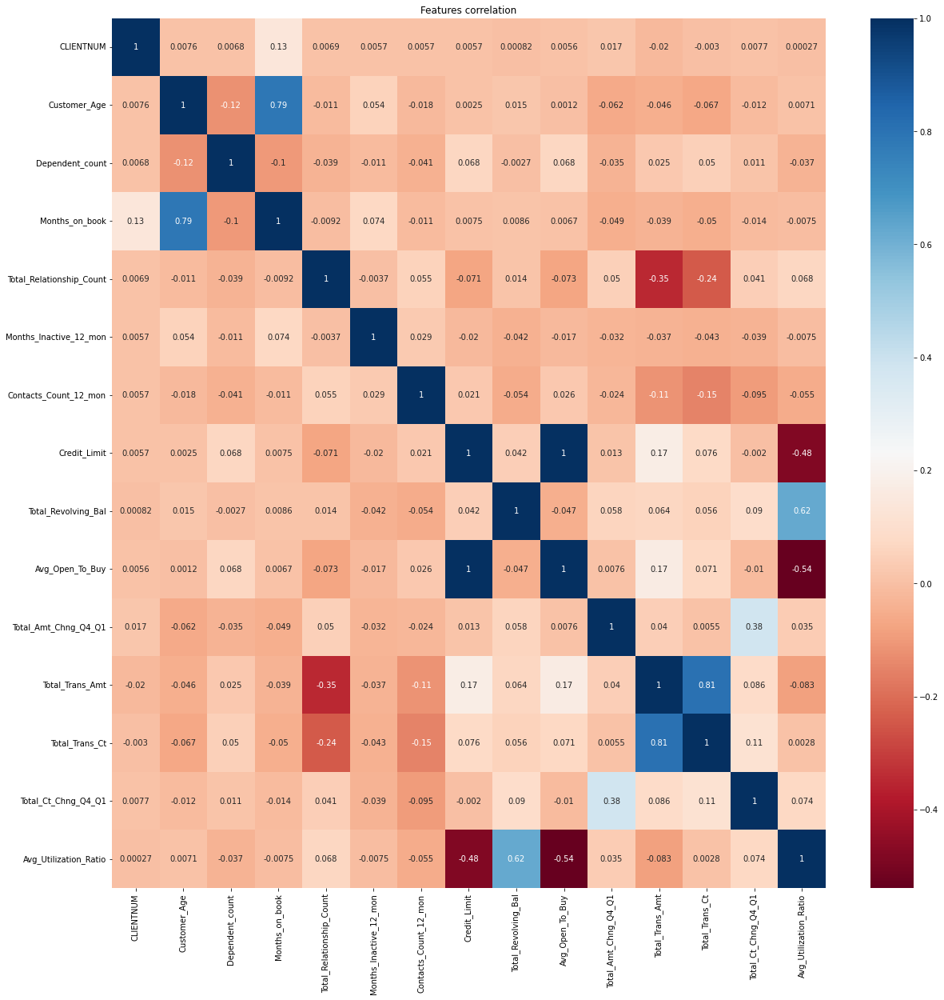

In [10]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True,cmap='RdBu')
plt.title("Features correlation")

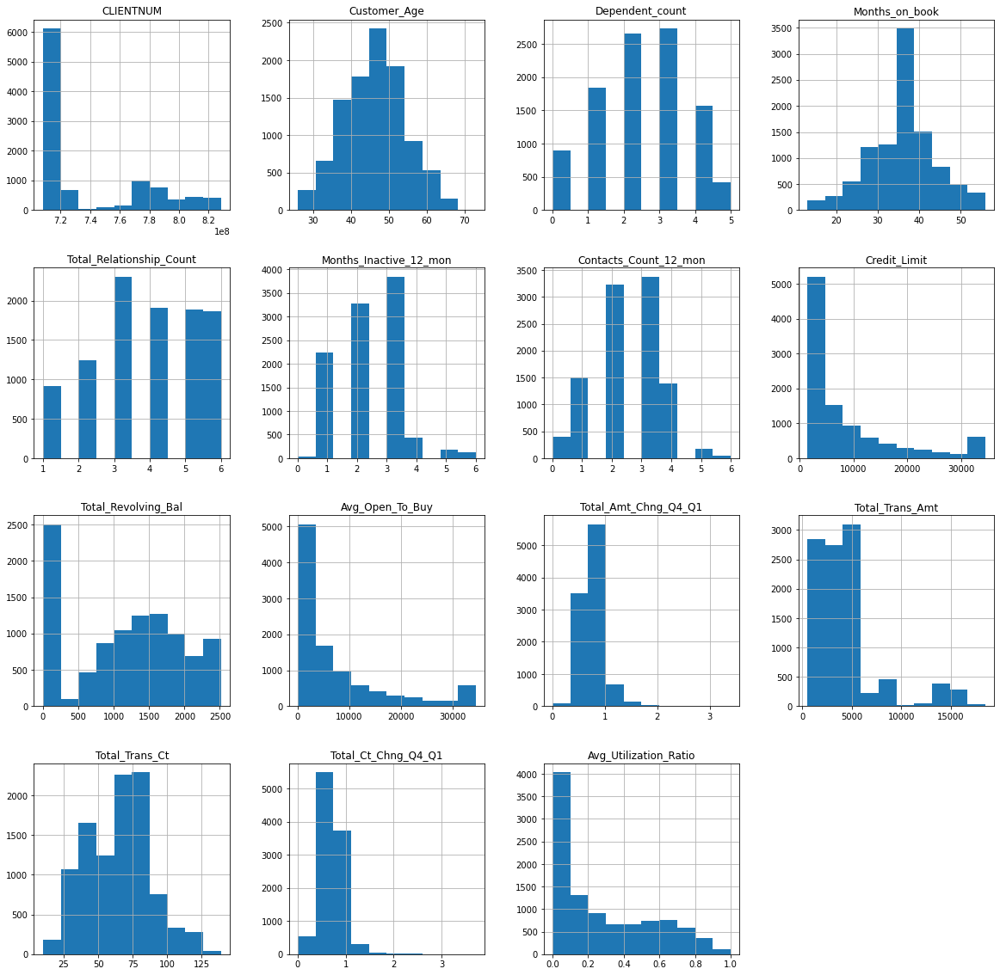

In [11]:
df.hist(figsize=(20,20))
plt.show()

In [12]:
''' 
The heatmap showed that Avg_Utilization_Ration and Total_Revolving_Bal are positively correlated (0.62).
Total_Trans_Ct and Total_Trans_Amt are also positively correlated (0.81).
Credit_Limit and Avg_Open_To_Buy are positively correlated (1).
Avg_Utilization_Ratio is negatively corrected to Avg_Open_To_Buy(-0.54) and Credit_Limit(-0.48).
'''

' \nThe heatmap showed that Avg_Utilization_Ration and Total_Revolving_Bal are positively correlated (0.62).\nTotal_Trans_Ct and Total_Trans_Amt are also positively correlated (0.81).\nCredit_Limit and Avg_Open_To_Buy are positively correlated (1).\nAvg_Utilization_Ratio is negatively corrected to Avg_Open_To_Buy(-0.54) and Credit_Limit(-0.48).\n'

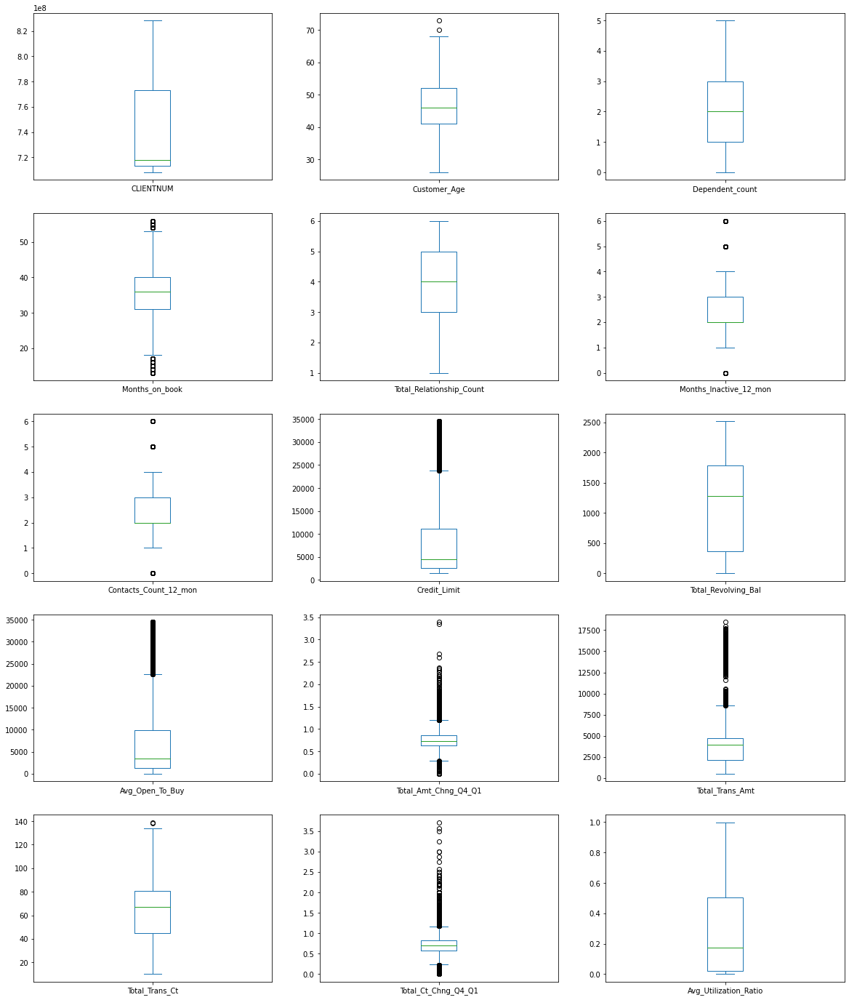

In [13]:
df.plot(kind='box', subplots=True, layout=(12,3), sharex=False, sharey=False, figsize=(20, 60))
plt.show()

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Customer_Age'>

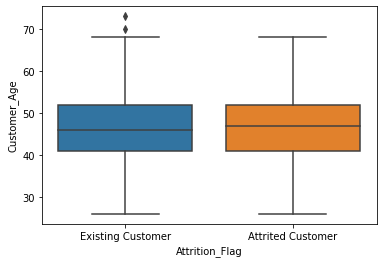

In [14]:
sns.boxplot(x='Attrition_Flag', y='Customer_Age', data=df)
#there is no difference so we will be excluding Customer_Age

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Dependent_count'>

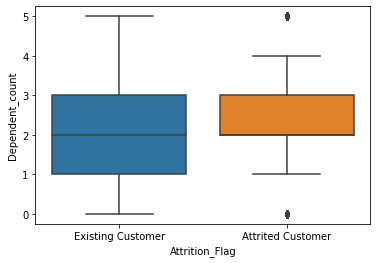

In [15]:
sns.boxplot(x='Attrition_Flag', y='Dependent_count', data=df)
#Depedent_count will be included as a feature

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Months_on_book'>

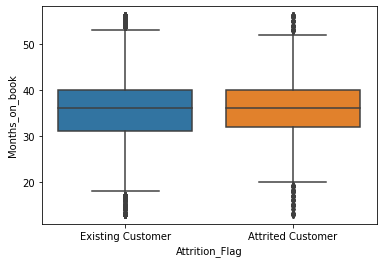

In [16]:
sns.boxplot(x='Attrition_Flag', y='Months_on_book', data=df)
#there are no differences between the two so we will exclude Months_on_book

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Relationship_Count'>

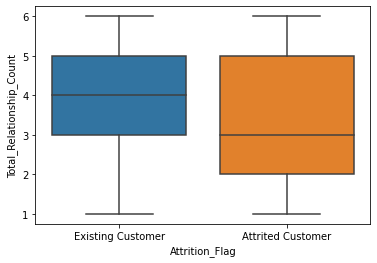

In [17]:
sns.boxplot(x='Attrition_Flag', y='Total_Relationship_Count', data=df)

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Months_Inactive_12_mon'>

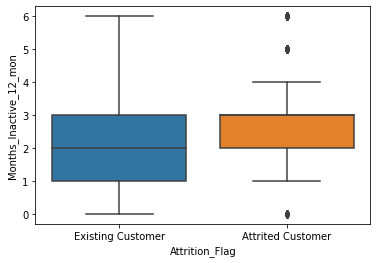

In [18]:
sns.boxplot(x='Attrition_Flag', y='Months_Inactive_12_mon', data=df)

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Contacts_Count_12_mon'>

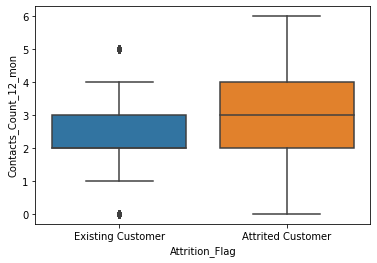

In [19]:
sns.boxplot(x='Attrition_Flag', y='Contacts_Count_12_mon', data=df)

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Credit_Limit'>

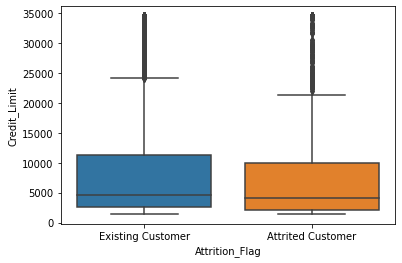

In [20]:
sns.boxplot(x='Attrition_Flag', y='Credit_Limit', data=df)

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Revolving_Bal'>

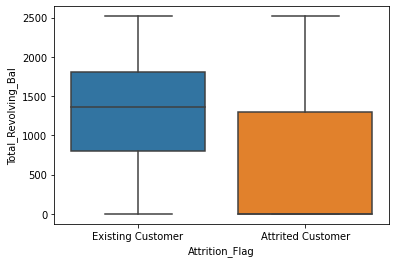

In [21]:
sns.boxplot(x='Attrition_Flag', y='Total_Revolving_Bal', data=df)

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Avg_Open_To_Buy'>

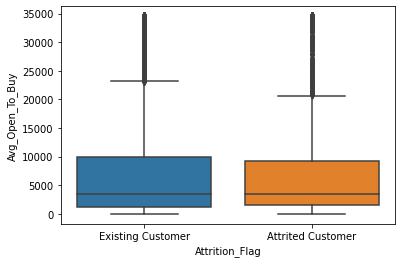

In [22]:
sns.boxplot(x='Attrition_Flag', y='Avg_Open_To_Buy', data=df)
#there is no differnces so we will exclude Avg_Open_To_Buy from the predictor

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Amt_Chng_Q4_Q1'>

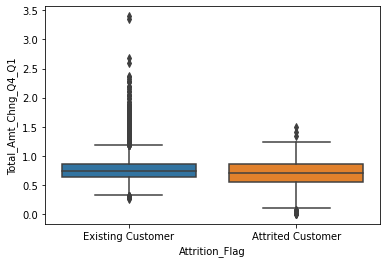

In [23]:

sns.boxplot(x='Attrition_Flag', y='Total_Amt_Chng_Q4_Q1', data=df)
#there is a small difference so we will add it to the predictor


In [24]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [25]:
df['Attrition_Flag'].value_counts(normalize=True)

Existing Customer    0.83934
Attrited Customer    0.16066
Name: Attrition_Flag, dtype: float64

We are going to conduct Chi-Square test now since we are dealing with categorial features


In [26]:
print(df['Card_Category'].unique())

#check if marital status is statically significant to Attribution_flag

cross_tab = pd.crosstab(index=df['Card_Category'],
                        columns=df['Attrition_Flag'])

chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(cross_tab)

print(f"chi2 statistic:     {chi2_stat:.5g}")
print(f"p-value:            {p:.5g}")
print(f"degrees of freedom: {dof}")
print("expected frequencies:\n",expected)

'''we see that this category is not statically significant '''

['Blue' 'Gold' 'Silver' 'Platinum']
chi2 statistic:     2.2342
p-value:            0.52524
degrees of freedom: 3
expected frequencies:
 [[1.51598420e+03 7.92001580e+03]
 [1.86365162e+01 9.73634838e+01]
 [3.21319246e+00 1.67868075e+01]
 [8.91660906e+01 4.65833909e+02]]


'we see that this category is not statically significant '

In [27]:
print(df['Marital_Status'].unique())



'''check if marital status is statically significant to Attribution_flag
    null hypothesis: there is no significant difference between observed and expected frequencies '''

cross_tab = pd.crosstab(index=df['Marital_Status'],
                        columns=df['Attrition_Flag'])

chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(cross_tab)

print(f"chi2 statistic:     {chi2_stat:.5g}")
print(f"p-value:            {p:.5g}")
print(f"degrees of freedom: {dof}")
print("expected frequencies:\n",expected)




'''we see that this category is not statically significant as p value is lesser than significant level of 0.05'''

['Married' 'Single' 'Unknown' 'Divorced']
chi2 statistic:     6.0561
p-value:            0.10891
degrees of freedom: 3
expected frequencies:
 [[ 120.17339785  627.82660215]
 [ 753.01165202 3933.98834798]
 [ 633.48089266 3309.51910734]
 [ 120.33405747  628.66594253]]


'we see that this category is not statically significant as p value is lesser than significant level of 0.05'

In [28]:

cross_tab = pd.crosstab(index=df['Education_Level'],
                        columns=df['Attrition_Flag'])

chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(cross_tab)
 
print(f"chi2 statistic:     {chi2_stat:.5g}")
print(f"p-value:            {p:.5g}")
print(f"degrees of freedom: {dof}")
print("expected frequencies:\n",expected)

'''Here too the difference is not significant '''

chi2 statistic:     12.511
p-value:            0.051489
degrees of freedom: 6
expected frequencies:
 [[ 162.74819789  850.25180211]
 [  72.45748988  378.54251012]
 [ 502.54330009 2625.45669991]
 [ 323.40782068 1689.59217932]
 [  82.90036536  433.09963464]
 [ 238.90085909 1248.09914091]
 [ 244.04196702 1274.95803298]]


'Here too the difference is not significant '

In [29]:
y = df['Attrition_Flag'].replace({'Attrited Customer':1, 'Existing Customer':0})
print(y.head(10))
print(y.tail(10))

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
Name: Attrition_Flag, dtype: int64
10117    0
10118    1
10119    1
10120    0
10121    0
10122    0
10123    1
10124    1
10125    1
10126    1
Name: Attrition_Flag, dtype: int64


In [30]:
print(df['Income_Category'].unique())

df['Income_Category'] = df['Income_Category'].replace({'Unknown':1,
                                                        'Less than $40K':1,
                                                        '$40K - $60K':2,
                                                        '$60K - $80K':3,
                                                        '$80K - $120K':4,
                                                        '$120K +':5})


['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']


In [31]:
dummies_df = pd.DataFrame(df['Gender'].replace({'M':0, 'F':1}))
print(dummies_df.shape)

(10127, 1)


In [32]:
numericals = ['Dependent_count',
            'Total_Relationship_Count',
            'Months_Inactive_12_mon',
            'Contacts_Count_12_mon',
            'Total_Trans_Ct',
            'Avg_Utilization_Ratio',
             'Income_Category',
             'Total_Amt_Chng_Q4_Q1'
             ]

X = df[numericals]

scaler = StandardScaler()
scaler.fit(X)

std_numerical_data = scaler.transform(X)
std_df = pd.DataFrame(std_numerical_data)
std_df.columns = [i + '_std' for i in numericals]
std_df

,Dependent_count_std,Total_Relationship_Count_std,Months_Inactive_12_mon_std,Contacts_Count_12_mon_std,Total_Trans_Ct_std,Avg_Utilization_Ratio_std,Income_Category_std,Total_Amt_Chng_Q4_Q1_std
0,0.503368,0.763943,-1.327136,0.492404,-0.973895,-0.775882,0.597300,2.623494
1,2.043199,1.407306,-1.327136,-0.411616,-1.357340,-0.616276,-0.887628,3.563293
2,0.503368,0.120579,-1.327136,-2.219655,-1.911206,-0.997155,1.339764,8.367214
3,1.273283,-0.522785,1.641478,-1.315636,-1.911206,1.759686,-0.887628,2.942843
4,0.503368,0.763943,-1.327136,-2.219655,-1.570365,-0.997155,0.597300,6.455682
...,...,...,...,...,...,...,...,...
10122,-0.266547,-0.522785,-0.337598,0.492404,2.221481,0.678714,-0.145164,-0.259771
10123,-0.266547,0.120579,-0.337598,0.492404,0.176440,0.856458,-0.145164,0.201004
10124,-1.036462,0.763943,0.651940,1.396424,-0.207005,-0.997155,-0.887628,0.269436
10125,-0.266547,0.120579,0.651940,0.492404,-0.121795,-0.997155,-0.145164,-1.026208


In [33]:
'''putting back the gender column after scaling'''
df_prep = pd.concat([dummies_df,std_df],axis=1)
print(df_prep.head())

   Gender  Dependent_count_std  Total_Relationship_Count_std  \
0       0             0.503368                      0.763943   
1       1             2.043199                      1.407306   
2       0             0.503368                      0.120579   
3       1             1.273283                     -0.522785   
4       0             0.503368                      0.763943   

   Months_Inactive_12_mon_std  Contacts_Count_12_mon_std  Total_Trans_Ct_std  \
0                   -1.327136                   0.492404           -0.973895   
1                   -1.327136                  -0.411616           -1.357340   
2                   -1.327136                  -2.219655           -1.911206   
3                    1.641478                  -1.315636           -1.911206   
4                   -1.327136                  -2.219655           -1.570365   

   Avg_Utilization_Ratio_std  Income_Category_std  Total_Amt_Chng_Q4_Q1_std  
0                  -0.775882             0.597300       

In [34]:
X = df_prep
y = df.Attrition_Flag

Implementing LOGREG & RandomForest & Naive Gaussian Models

In [35]:
'''splitting the data for training and testing '''

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)

In [36]:
algo = [
    LogisticRegression(),
    RandomForestClassifier(random_state=42,max_depth=5,n_estimators=100,max_features='auto'),
    GaussianNB()

]

roc_list = []

for names in algo:
    model = names
    print(f'Model: {model}')
    %time model.fit(X_train,y_train)
    y_pred = model.predict_proba(X_test)[:,1]
    score = roc_auc_score(y_test,y_pred)
    roc_list.append(score)
    print(f'AUC ROC Score: {score}')
    print(f'TRAINING ACCURACY: {accuracy_score(y_train,model.predict(X_train))}')
    print(f'TESTING  ACCURACY: {accuracy_score(y_test, model.predict(X_test))}')
    print('------------------------------------------------------------------------------')


Model: LogisticRegression()
CPU times: total: 0 ns
Wall time: 28.4 ms
AUC ROC Score: 0.8732313918196271
TRAINING ACCURACY: 0.8870309414088215
TESTING  ACCURACY: 0.8799368088467614
------------------------------------------------------------------------------
Model: RandomForestClassifier(max_depth=5, random_state=42)
CPU times: total: 391 ms
Wall time: 401 ms
AUC ROC Score: 0.929195548489666
TRAINING ACCURACY: 0.9161290322580645
TESTING  ACCURACY: 0.9036334913112164
------------------------------------------------------------------------------
Model: GaussianNB()
CPU times: total: 0 ns
Wall time: 7 ms
AUC ROC Score: 0.8867767018355254
TRAINING ACCURACY: 0.8853192890059249
TESTING  ACCURACY: 0.8759873617693523
------------------------------------------------------------------------------


For Individual Score for each Model

In [40]:
lr = LogisticRegression()
lr.fit(X_train,y_train)
y_pred = lr.predict(X_test)

print('Model:', lr)
print('TRAINING ACCURACY:', accuracy_score(y_train, lr.predict(X_train)))
print(f'/nTESTIG ACCURACY {accuracy_score(y_test, lr.predict(X_test))}')
print("Precision:",precision_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))
print("Recall:",recall_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))
print("F1:",f1_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))

Model: LogisticRegression()
TRAINING ACCURACY: 0.8870309414088215
/nTESTIG ACCURACY 0.8799368088467614
Precision: 0.8953538862353452
Recall: 0.9703529411764706
F1: 0.931345980126468


In [43]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred = gnb.predict(X_test)

print('Model:', gnb)
print('TRAINING ACCURACY:', accuracy_score(y_train, gnb.predict(X_train)))
print('TESTING ACCURACY:', accuracy_score(y_test, gnb.predict(X_test)))
print("Precision:",precision_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))
print("Recall:",recall_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))
print("F1:",f1_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))



Model: GaussianNB()
TRAINING ACCURACY: 0.8853192890059249
TESTING ACCURACY: 0.8759873617693523
Precision: 0.8887934735938171
Recall: 0.9741176470588235
F1: 0.9295015716210149


In [ ]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

print('Model:', rf)
print('TESTING ACCURACY:', accuracy_score(y_test, rf.predict(X_test)))
print("Precision:",precision_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))
print("Recall:",recall_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))
print("F1:",f1_score(y_test, y_pred, average='binary', pos_label='Existing Customer'))

Model: RandomForestClassifier(random_state=42)
TESTING ACCURACY: 0.9218009478672986
Precision: 0.9361702127659575
Recall: 0.9731764705882353
F1: 0.9543147208121828
